In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import random
random.seed(1234)

import pandas as pd
from pandas_profiling import ProfileReport

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
import altair as alt

# Enable Jupyter Notebook for Altair
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

## Load data sets

In [3]:
# load in data sets for both math and portuguese student performance
mat_scores_df = pd.read_csv('../data/raw/student-mat.csv', delimiter=";")
por_scores_df = pd.read_csv('../data/raw/student-por.csv', delimiter=";")

## Split test and train for each data set, saving to csv

In [4]:
# math data split for train/test
X_mat = mat_scores_df.drop(columns=['G3'])
y_mat = mat_scores_df[['G3']]

X_train_mat, X_test_mat, y_train_mat, y_test_mat = train_test_split(X_mat, 
                                                        y_mat, 
                                                        test_size=0.20, 
                                                        random_state=100)

# merge X and y columns for train and test sets, save to csv
mat_train = pd.concat([X_train_mat, y_train_mat], axis = 1)
mat_train.to_csv('../data/processed/student-mat-trainsplit.csv')

mat_test = pd.concat([X_test_mat, y_test_mat], axis = 1)
mat_test.to_csv('../data/processed/student-mat-testsplit.csv')

In [5]:
# portuguese data split for train/test
X_por = por_scores_df.drop(columns=['G3'])
y_por = por_scores_df[['G3']]

X_train_por, X_test_por, y_train_por, y_test_por = train_test_split(X_por, 
                                                    y_por, 
                                                    test_size=0.20, 
                                                    random_state=100)

# merge X and y columns for train and test sets, save to csv
por_train = pd.concat([X_train_por, y_train_por], axis = 1)
por_train.to_csv('../data/processed/student-por-trainsplit.csv')

por_test = pd.concat([X_test_por, y_test_por], axis = 1)
por_test.to_csv('../data/processed/student-por-testsplit.csv')

## Generate and explore profiling reports for the data frames

In [6]:
# generate pandas profiling reports for each training set
mat_profile = ProfileReport(mat_train, title='Pandas Profiling Report for Math', html={'style':{'full_width':True}})
por_profile = ProfileReport(por_train, title='Pandas Profiling Report for Portuguese', html={'style':{'full_width':True}})

In [7]:
mat_train.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu           int64
Fedu           int64
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime     int64
studytime      int64
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel         int64
freetime       int64
goout          int64
Dalc           int64
Walc           int64
health         int64
absences       int64
G1             int64
G2             int64
G3             int64
dtype: object

In [8]:
por_train.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu           int64
Fedu           int64
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime     int64
studytime      int64
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel         int64
freetime       int64
goout          int64
Dalc           int64
Walc           int64
health         int64
absences       int64
G1             int64
G2             int64
G3             int64
dtype: object

In [9]:
mat_profile

In [10]:
por_profile

## Image from Pandas Profile Correlation Heatmap

### Math training dataset
![](../img/mat_correlation_heatmap.png)

### Portuguese training dataset
![](../img/por_correlation_heatmap.png)

## General Observations & Questions
- High Correlation Attributes:
    - G3 (final grade from period 3) with G2 (the grade from period 2) & G3 with G1 (grade from period 1) in both data sets
    - Similarly, G1 is highly correlated to G3.
    - Implications: Consider excluding G1 and G2 from our predictive model?
- Numeric vs Categorical feature counts from the profiling output 
     - Default settings have given us different variable types in each data set (13 & 13 vs  14 & 12)
     - Manually specify each column type to mitigate?
- Attributes worth exploring based on non-absurdly high correlation score (Pearson's & Spearman's):
    - Math:
        - `fedu`
        - `medu`
        - `failures`
        - `dalc`
        - `age`
        - `traveltime`
    - Portuguese:
        - `fedu`
        - `medu`
        - `failures`
        - `studytime`
        - `Dalc`
        - `traveltime`
        - `walc`
- Ordinal (Ordered Categorical) variables
    - `famrel`, `freetime`, `goout`, `Dalc`, `Walc`, `health`
    - We should probably not perform one-hot-encoding for these variables since there is a natural ordering.
- High correlations between specific features
    - Examples: father and mother education, workday and weekday alcohol consumption
    - May affect our research question since highly collinear features distort feature importances

## Columns Description for reference

In [ ]:
1 school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)
2 sex - student's sex (binary: 'F' - female or 'M' - male)
3 age - student's age (numeric: from 15 to 22)
4 address - student's home address type (binary: 'U' - urban or 'R' - rural)
5 famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)
6 Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)
7 Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)
8 Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 â€“ 5th to 9th grade, 3 â€“ secondary education or 4 â€“ higher education)
9 Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
10 Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
11 reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')
12 guardian - student's guardian (nominal: 'mother', 'father' or 'other')
13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)
14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)
15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)
16 schoolsup - extra educational support (binary: yes or no)
17 famsup - family educational support (binary: yes or no)
18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)
19 activities - extra-curricular activities (binary: yes or no)
20 nursery - attended nursery school (binary: yes or no)
21 higher - wants to take higher education (binary: yes or no)
22 internet - Internet access at home (binary: yes or no)
23 romantic - with a romantic relationship (binary: yes or no)
24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)
25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)
26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)
27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)
28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)
29 health - current health status (numeric: from 1 - very bad to 5 - very good)
30 absences - number of school absences (numeric: from 0 to 93)

 ## Automated Altair Plot Assignment (Math)

In [40]:
# Automate setting of dynamic variables for various altair plots
# https://stackoverflow.com/a/46897025

import sys

current_module = module = sys.modules[__name__] 
# setattr(current_module, "string_for_var_name", value)

In [140]:
boxplot_nom_list = ["school", "sex", "address", "famsize", "Pstatus", "Mjob", "Fjob", "reason", "guardian",
                    "age",
                    "schoolsup", "famsup", "paid", "activities", "nursery", "higher","internet","romantic"]
boxplot_ord_list = ["Medu", "Fedu", "traveltime", "studytime", 
                    "failures", # maybe?
                   "famrel", "freetime","goout", "Dalc", "Walc", "health"]
scatterplot_list = ["absences"]

In [190]:
# Boxplot Nominal Automation
for i in boxplot_nom_list:
    var_name = "mat_"+i
    
    alt_chart = alt.Chart(mat_train).mark_boxplot().encode(
    y=alt.Y(i+':N'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" (Nominal) vs Math Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

In [191]:
# Boxplot Ordinal Automation
for i in boxplot_ord_list:
    var_name = "mat_"+i
    
    alt_chart = alt.Chart(mat_train).mark_boxplot().encode(
    y=alt.Y(i+':O'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" (Ordinal) vs Math Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

In [192]:
# Scatterplot Automation
for i in scatterplot_list:
    var_name = "mat_"+i
    
    alt_chart = alt.Chart(mat_train).mark_point().encode(
    y=alt.Y(i+':Q'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" vs Math Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

## Automated Altair Plot Assignment (Portuguese)

In [220]:
# Boxplot Nominal Automation
for i in boxplot_nom_list:
    var_name = "por_"+i
    
    alt_chart = alt.Chart(por_train).mark_boxplot(color = "red").encode(
    y=alt.Y(i+':N'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" (Nominal) vs Portuguese Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

In [222]:
# Boxplot Ordinal Automation
for i in boxplot_ord_list:
    var_name = "por_"+i
    
    alt_chart = alt.Chart(por_train).mark_boxplot(color = "red").encode(
    y=alt.Y(i+':O'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" (Ordinal) vs Portuguese Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

In [223]:
# Scatterplot Automation
for i in scatterplot_list:
    var_name = "por_"+i
    
    alt_chart = alt.Chart(por_train).mark_point(color = "red").encode(
    y=alt.Y(i+':Q'),
    x=alt.X('G3:Q')
    ).properties(
        title =  i+" vs Portuguese Grades"
    )
    
    setattr(current_module, var_name, alt_chart)

## EDA for both Math and Portuguese

In [147]:
mat_train.describe(include="all")

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,316,316,316.000000,316,316,316,316.000000,316.000000,316,316,...,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000
unique,2,2,NaN,2,2,2,NaN,NaN,5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,GP,F,NaN,U,GT3,T,NaN,NaN,other,other,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,280,164,NaN,246,225,290,NaN,NaN,115,174,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,16.664557,NaN,NaN,NaN,2.797468,2.547468,NaN,NaN,...,3.958861,3.262658,3.120253,1.493671,2.294304,3.575949,5.560127,10.892405,10.642405,10.272152
std,NaN,NaN,1.260440,NaN,NaN,NaN,1.067616,1.090053,NaN,NaN,...,0.888132,0.971334,1.091715,0.913718,1.289309,1.395204,8.256187,3.381716,3.868715,4.755146
min,NaN,NaN,15.000000,NaN,NaN,NaN,1.000000,0.000000,NaN,NaN,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,NaN,NaN,16.000000,NaN,NaN,NaN,2.000000,2.000000,NaN,NaN,...,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,8.000000,8.000000
50%,NaN,NaN,17.000000,NaN,NaN,NaN,3.000000,2.500000,NaN,NaN,...,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,3.000000,11.000000,11.000000,11.000000
75%,NaN,NaN,18.000000,NaN,NaN,NaN,4.000000,4.000000,NaN,NaN,...,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000


In [257]:
por_train.describe(include="all")

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,519,519,519.000000,519,519,519,519.000000,519.000000,519,519,...,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000,519.000000
unique,2,2,NaN,2,2,2,NaN,NaN,5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,GP,F,NaN,U,GT3,T,NaN,NaN,other,other,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,334,312,NaN,357,369,459,NaN,NaN,215,292,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,16.707129,NaN,NaN,NaN,2.514451,2.327553,NaN,NaN,...,3.934489,3.150289,3.171484,1.491329,2.246628,3.475915,3.489403,11.439306,11.591522,11.963391
std,NaN,NaN,1.188331,NaN,NaN,NaN,1.133588,1.097836,NaN,NaN,...,0.944168,1.051086,1.165576,0.904420,1.279804,1.456876,4.464292,2.758573,2.905660,3.236586
min,NaN,NaN,15.000000,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,16.000000,NaN,NaN,NaN,2.000000,1.000000,NaN,NaN,...,4.000000,3.000000,2.000000,1.000000,1.000000,2.000000,0.000000,10.000000,10.000000,10.000000
50%,NaN,NaN,17.000000,NaN,NaN,NaN,2.000000,2.000000,NaN,NaN,...,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,2.000000,11.000000,12.000000,12.000000
75%,NaN,NaN,18.000000,NaN,NaN,NaN,4.000000,3.000000,NaN,NaN,...,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,5.000000,13.000000,13.000000,14.000000


Portuguese data set has more observations (519) than Math data set (316).

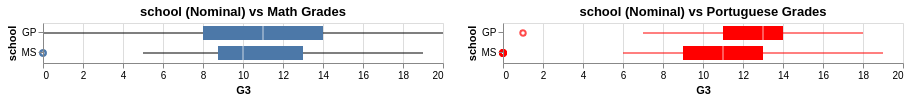

In [262]:
mat_school | por_school

For both subjects, students from GP school tends to perform better than MS based on median value. For Portuguese, GP students seems to have a clear performance advantage over the MS students with less variability.

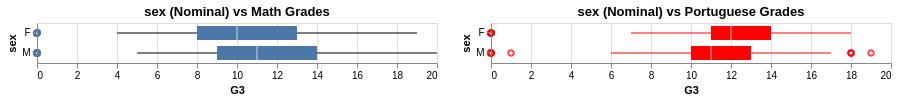

In [261]:
mat_sex | por_sex

Males tend to do better in Math while Females tend to do better in Portuguese.

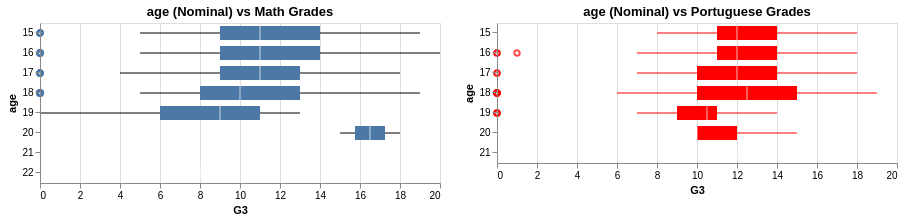

In [227]:
mat_age | por_age

There seems to be a common drop in performance for 19 years old teenagers which is common in both subjects. This is pretty puzzling. For 20 years old, they tend to do exceptionally well in Math but the same cannot be said for Portuguese.

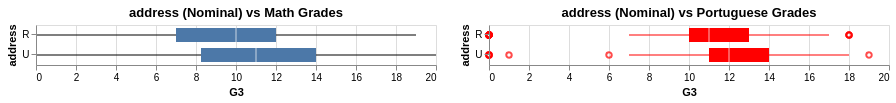

In [263]:
mat_address | por_address

Those who live in Urban areas tend to perform better in both subjects compared to those living in Rural areas. This might be an indicator of family economic status or social status, which can have a positive impact on students' development.

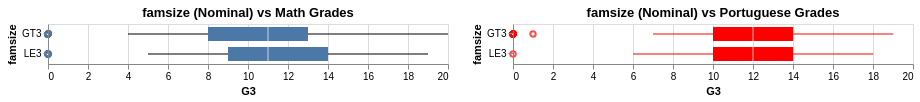

In [264]:
mat_famsize | por_famsize

Family sizes (Greater than 3 or Lesser than 3) does not seem to have a critical impact on performance.

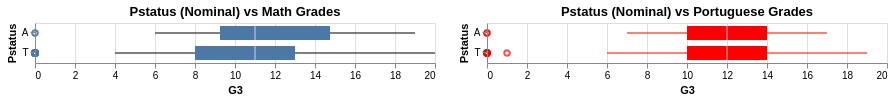

In [230]:
mat_Pstatus | por_Pstatus

Parents' cohabitation status (Away or Together) does not seem to have a strong impact on performance.

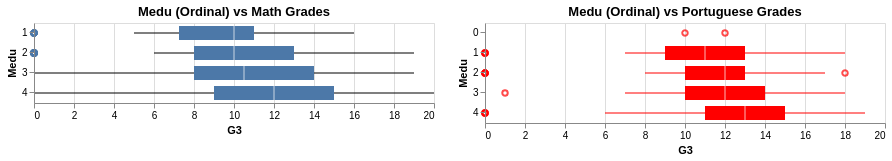

In [231]:
mat_Medu | por_Medu

Mother's Education level seems to have some impact on student's performance. The more educated the mother is, the greater the median performance of the student.

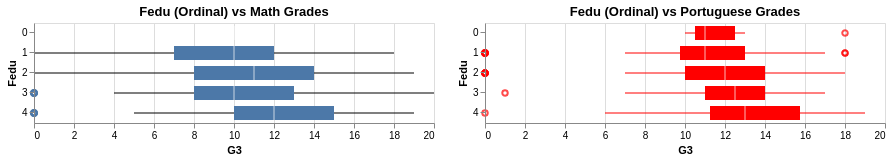

In [232]:
mat_Fedu | por_Fedu

Father's Education level seems to have some impact on student's performance. The more educated the father is, the greater the median performance of the student. This impact does not seem to be as strong in Math, and also does not seem as significant as a Mother's Education level.

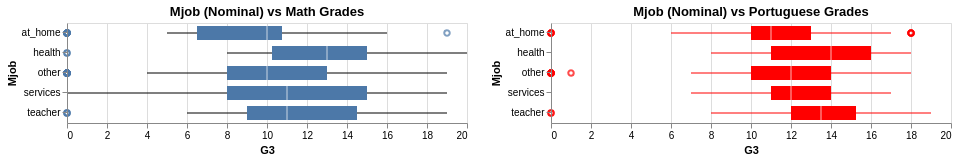

In [233]:
mat_Mjob | por_Mjob

Students' with mothers working in the healthcare industry tend to do better. A hypothesis could be the mothers could be doctors who are highly educated.

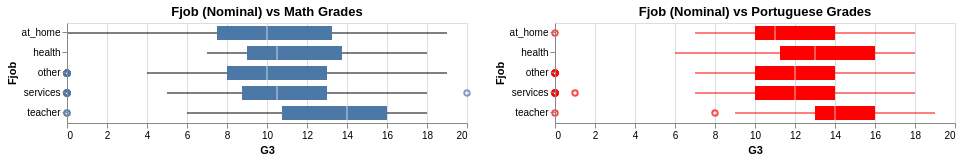

In [234]:
mat_Fjob | por_Fjob

Students with Fathers working as Teachers tend to do better.

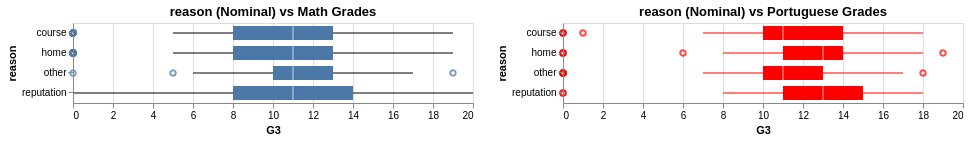

In [235]:
mat_reason | por_reason

Reasons for joining the school does not seem to have a significant impact for Math, but has a significant impact for Portuguese. Students tend to do well for Portuguese when they choose Schools that are closer to their homes or if it is a reputable school.

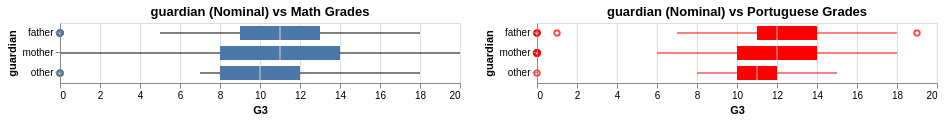

In [236]:
mat_guardian | por_guardian

Students' with guardians other than their immediate parents (Mother or Father) tend to do worse. This could be a sign of family stability/dynamics/economics, which can have a significant impact on the student's development.

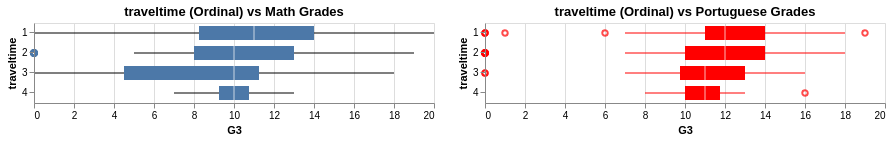

In [237]:
mat_traveltime | por_traveltime

Student with shorter travel time (1) tend to perform marginally better than those with longer travel time (4). This could be due to more time for studying or resting.

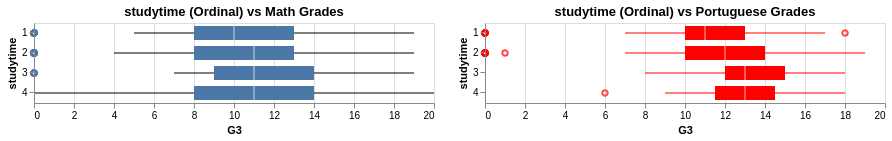

In [238]:
mat_studytime | por_studytime

Student with low studying hours (1) tend to perform worse than those with higher studying hours. This impact is not so significant in Math, but is significant in Portuguese.

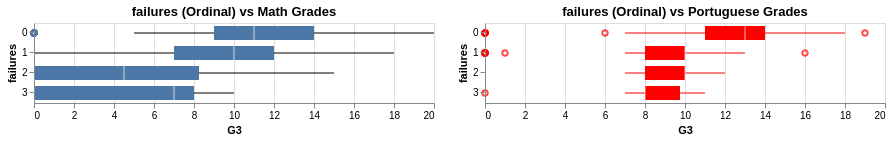

In [239]:
mat_failures | por_failures

Students with failed subjects tend to do worst compared to those with no failures. This impact is much more pronounced in Math than in Portuguese. A hypothesis could be that Math is a subject that requires practice, while Portuguese is their mother tongue language which they practice daily so it is much harder for students to fail Portuguese compared to Math. 

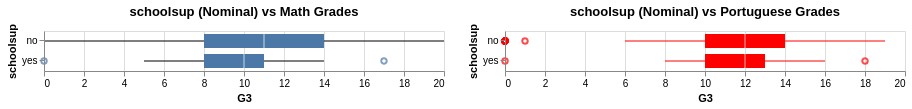

In [240]:
mat_schoolsup | por_schoolsup

No significant impact on both subjects for students with extra educational support on the subjects.

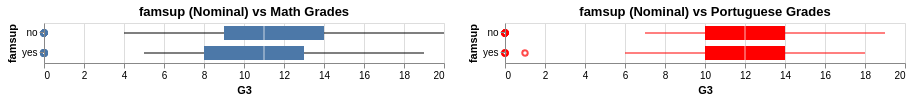

In [241]:
mat_famsup | por_famsup

No significant impact on both subjects for students with extra family educational support on the subjects.

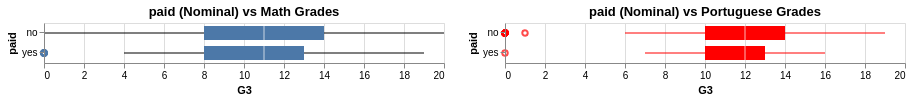

In [242]:
mat_paid | por_paid

No significant impact on both subjects for students with extra paid classes on the subjects.

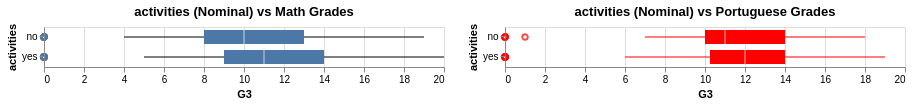

In [243]:
mat_activities | por_activities

Those with extra curricular activities tend to do better. Activities could be clubs or sports which could have differing beneficial mechanisms. For example, students may have a stronger social network in these activities and could have overall better academic discourse through their network. Alternatively, these activities may develop them on a holistic basis in terms of intellectual development.

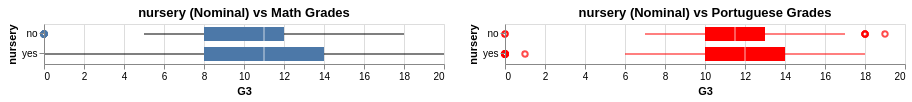

In [244]:
mat_nursery | por_nursery

Nursery school history for students does not seem to impact Math grades, but does seem to impact Portuguese grades.

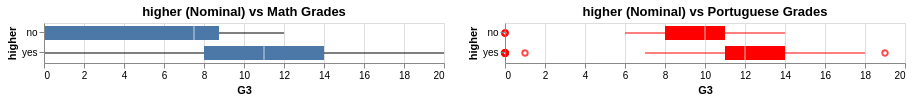

In [265]:
mat_higher | por_higher

Students who express interest in higher education tend to have better grades. This could be a chicken-or-egg issue: students who do badly know that they do not have the competency to go for higher education OR students who are not interested in higher education tend to be disinterested in studying and thus have poorer performances.

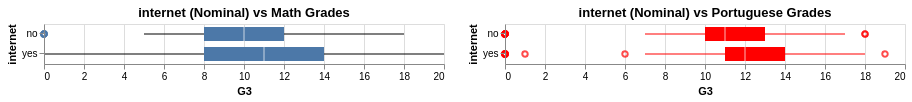

In [246]:
mat_internet | por_internet

Students with access to internet at home tend to perform better. This could be either due to better access to learning resources, or could be an indicator of family economic background.

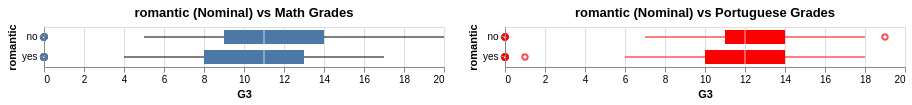

In [247]:
mat_romantic | por_romantic

Romantic relationships have no impact on students' grades.

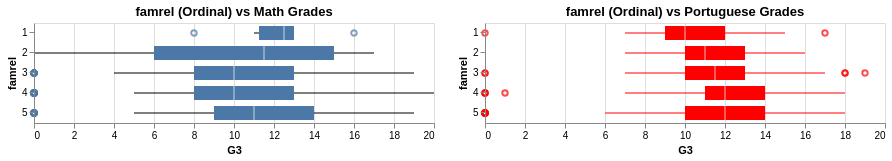

In [248]:
mat_famrel | por_famrel

Interestingly, those with bad family relationships (1) tend to do much better than those with good relationships for Math, but they do relatively poorer for Portuguese. 

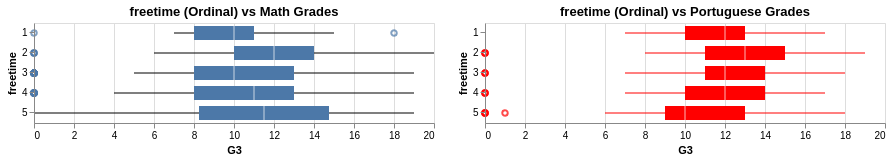

In [249]:
mat_freetime | por_freetime

Those with moderately high amounts of free time (2) tend to do better that those with much higher amounts of free time (5). This could indicate that students with sufficient free time are in better environment to develop themselves better.

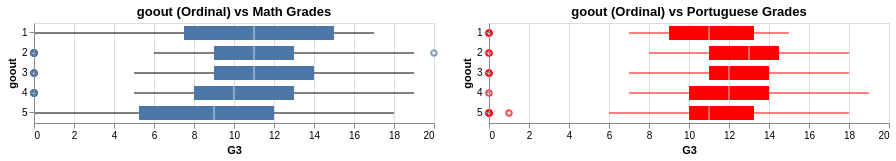

In [250]:
mat_goout | por_goout

For Math which is a subject that must be practised, students who go out after school frequently tend not to do well compared to those who do not go out after school. For Portuguese, those who go out moderately (2,3,4) after shool tend to do better than those at the extreme groups (1 or 5).

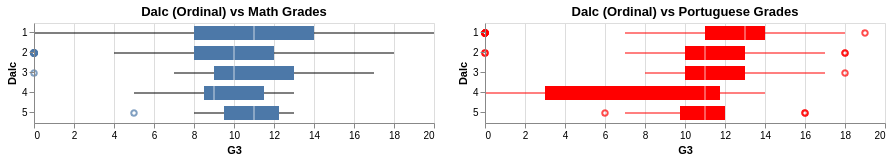

In [251]:
mat_Dalc | por_Dalc

Students who drink less  on workdays (1) tends to do better than those who drink more on workdays.

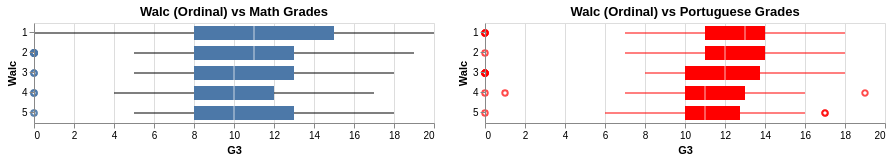

In [252]:
mat_Walc | por_Walc

Students who drink less on weekends (1) tends to do better than those who drink more on weekends.

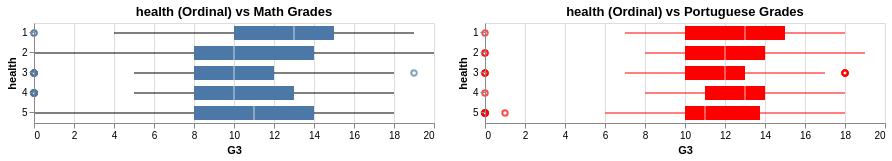

In [254]:
mat_health | por_health

Surprisingly, those with very bad health (1) tend to do better than those with good health. Not sure what could be the reason why.

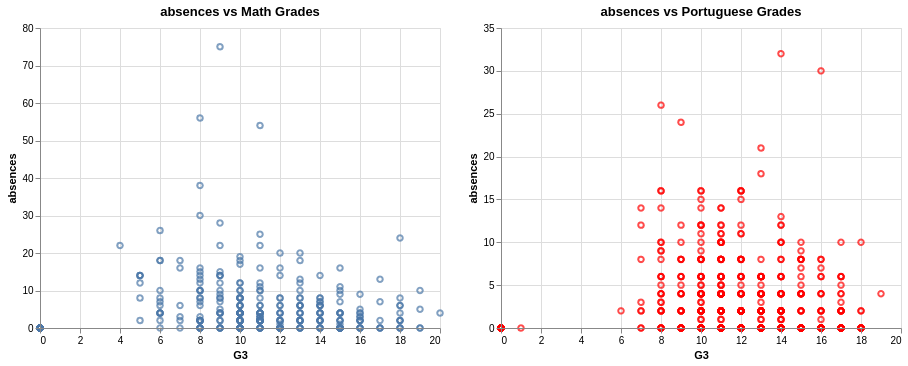

In [256]:
mat_absences | por_absences

There does not seem to be a clear relationship between days of absences vs student grades.